Tutorial from Deep Learning with Python by Franchois Chollet, Chapter 5

In [1]:
import keras
keras.__version__

Using TensorFlow backend.


'2.3.1'

### Visualizing Intermediate Activations

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#!ls "/content/drive/My Drive/Colab Notebooks/Book/Franchois_Chollet"

In [7]:
from keras.models import load_model

model = load_model('/content/drive/My Drive/Colab Notebooks/Book/Franchois_Chollet/cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 36992)            

This will be the input image we will use -- a picture of a cat, not part of images that the network was trained on:

In [9]:
uploaded = files.upload()

Saving 6.jpg to 6.jpg


In [0]:
img_path = '6.jpg'

In [11]:
# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

# Remember that the model was trained on inputs that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


Let's display our picture:

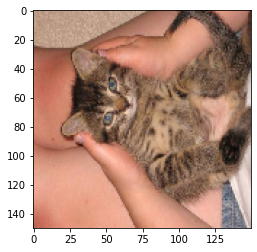

In [12]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [0]:
from keras import models

# Extract the outputs of the top 8 layers
layer_outputs = [layer.output for layer in model.layers[:8]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)

In [0]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

In [15]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


it's a 148 x 148 feature map with 32 channels. Let's try visualizing the 3rd channel:

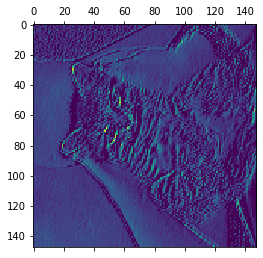

In [16]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

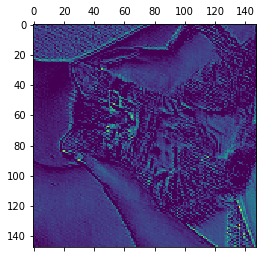

In [17]:
plt.matshow(first_layer_activation[0, :, :, 30], cmap='viridis')
plt.show()

MemoryError: ignored

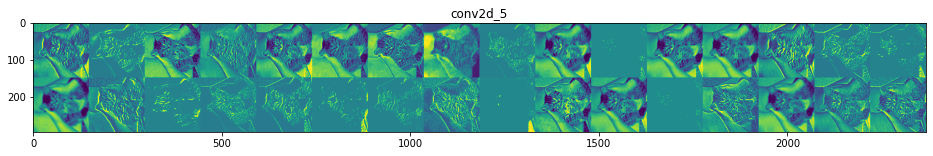

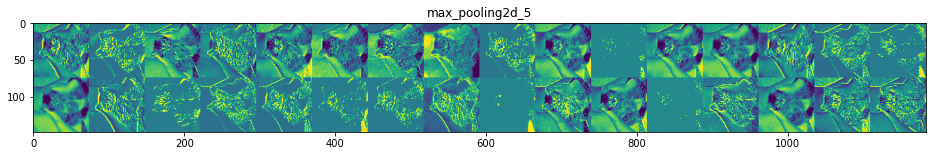

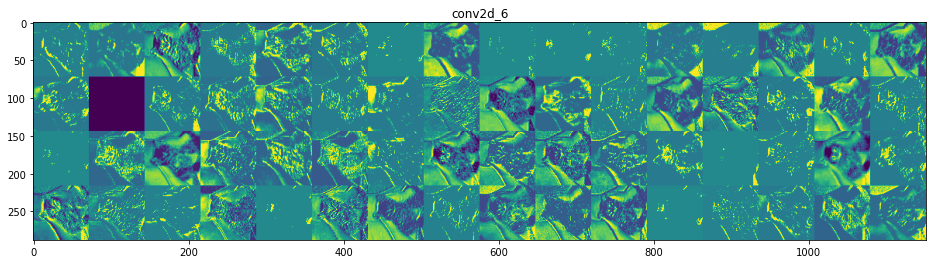

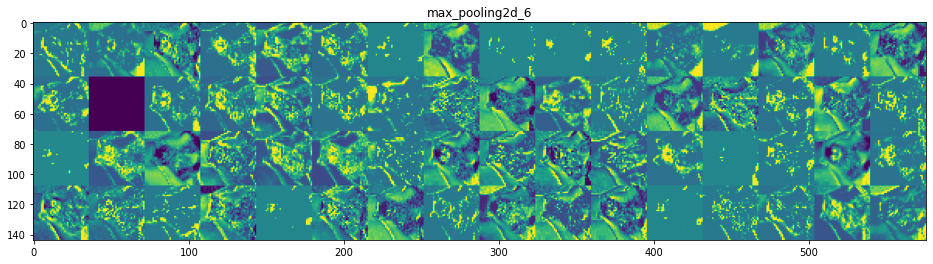

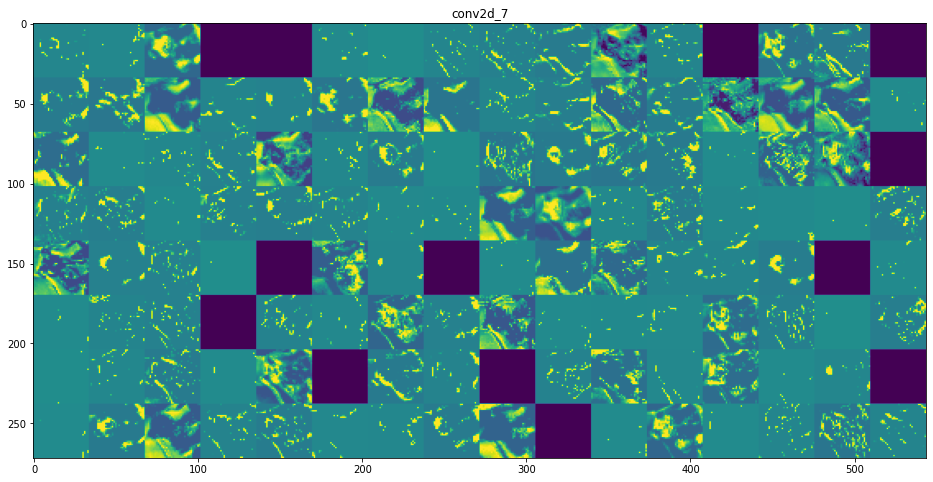

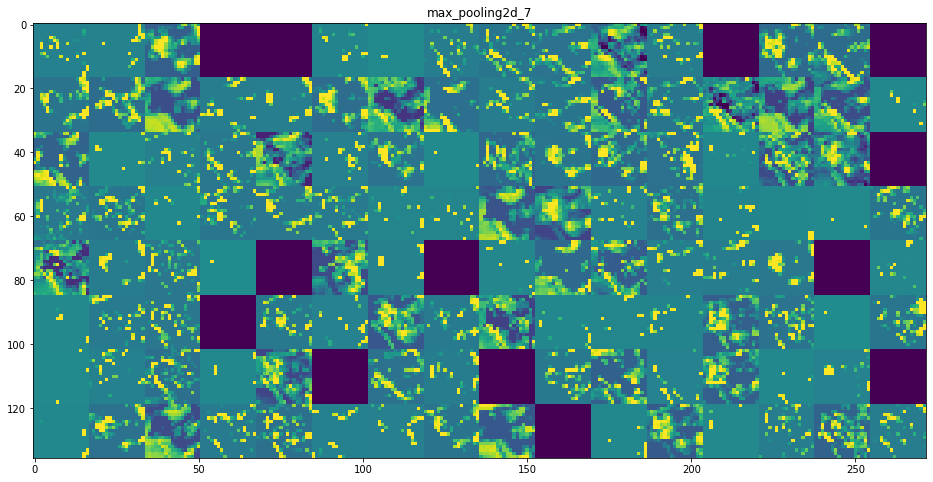

In [19]:
# These are the names of the layers, so we can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
  layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
  # This is the number of features in the feature map
  n_features = layer_activation.shape[-1]

  # The feature map has shape (1, size, size, n_features)
  size = layer_activation.shape[1]

  # We will tile the activation channels in this matrix
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))

  # We'll tile each filter into this big horizontal grid
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      # Post process the feature to make it visually palatable
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[col * size : (col + 1) * size, 
                   row * size : (row + 1) * size] = channel_image

  # Display the grid
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1],
                      scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid.astype('uint8'), aspect='auto', cmap='viridis')

plt.show()                 

### Visualizing ConvNet Filters

In [0]:
from keras.applications import VGG16
from keras import backend as K

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [0]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element -- which is a tensor
grads = K.gradients(loss, model.input)[0]

In [0]:
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [0]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [0]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128

# Run gradient ascent for 40 steps
step = 1.  # This is the magnitude of each gradient update
for i in range(40):
  # compute the loss value and gradient value
  loss_value, grads_value = iterate([input_img_data])
  # here we adjust the input image in the direction that maximizes the loss
  input_img_data  += grads_value * step

In [0]:
def deprocess_image(x):
  # normalize tensor: center on 0., ensure std is 0.1
  x -= x.mean()
  x /= (x.std() + 1e-5)
  x *= 0.1

  # clip to [0, 1]
  x += 0.5
  x = np.clip(x, 0, 1)

  # convert to RGB array
  x *= 255
  x = np.clip(x, 0, 255).astype('uint8')
  return x

In [0]:
def generate_pattern(layer_name, filter_index, size=150):
  # Build a loss function that maximizes the activation of nth filter of the layer considered
  layer_output = model.get_layer(layer_name).output
  loss = K.mean(layer_output[:,:,:, filter_index])

  # Compute the gradient of the input picture wrt this loss
  grads = K.gradients(loss, model.input)[0]

  # Normalization trick: we normalize the gradient
  grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

  # This function returns the loss and grads given the input picture
  iterate = K.function([model.input], [loss, grads])

  # we start from a gray image with some noise
  input_img_data = np.random.random((1, size, size, 3)) * 20 + 128

  # Run gradient ascent for 40 steps
  step = 1
  for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

  img = input_img_data[0]
  return deprocess_image(img)

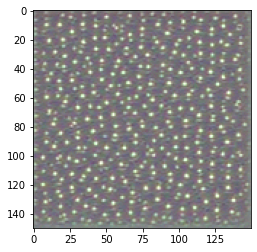

In [0]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

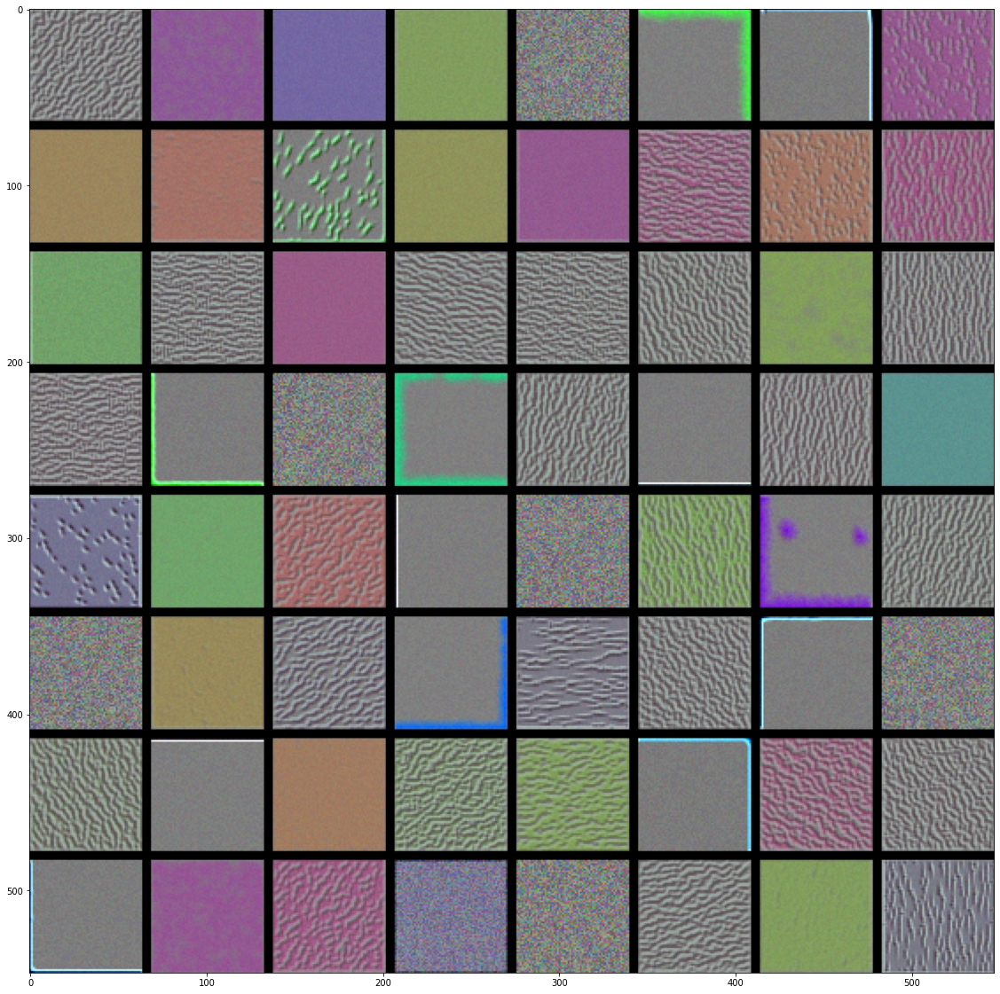

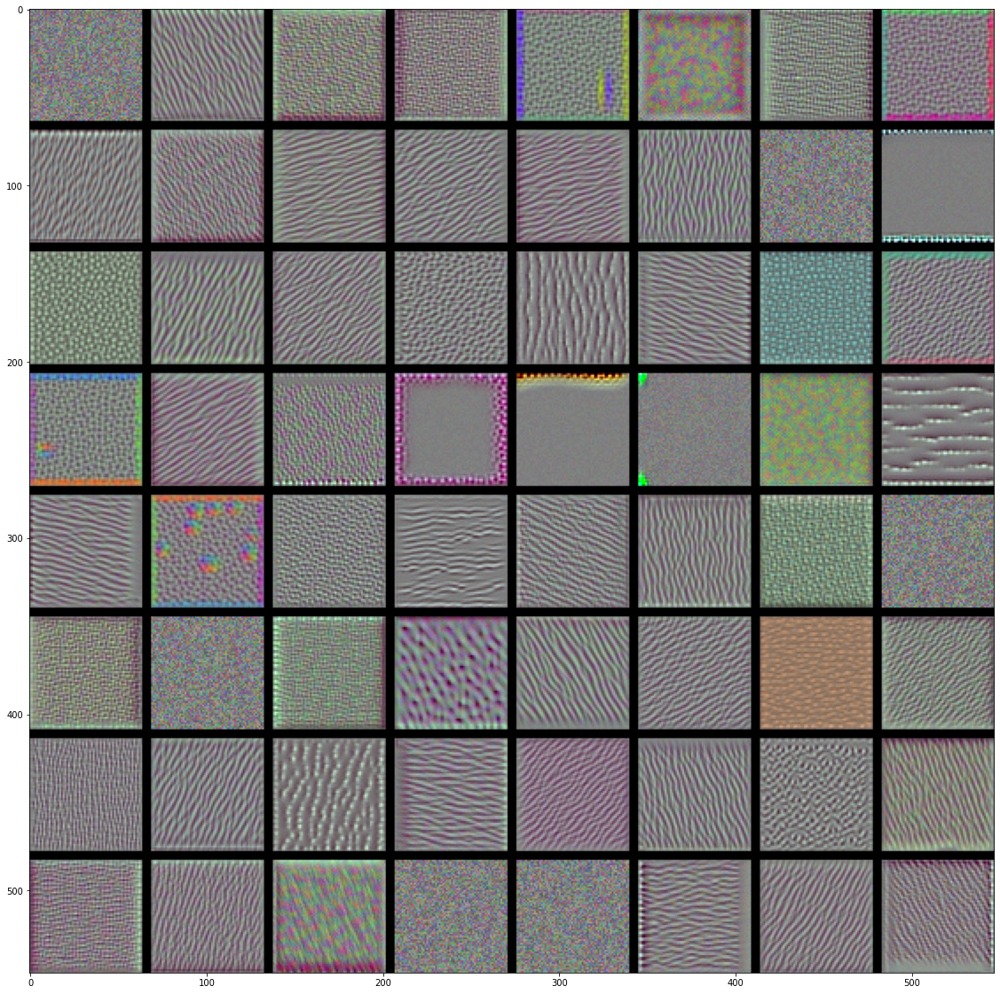

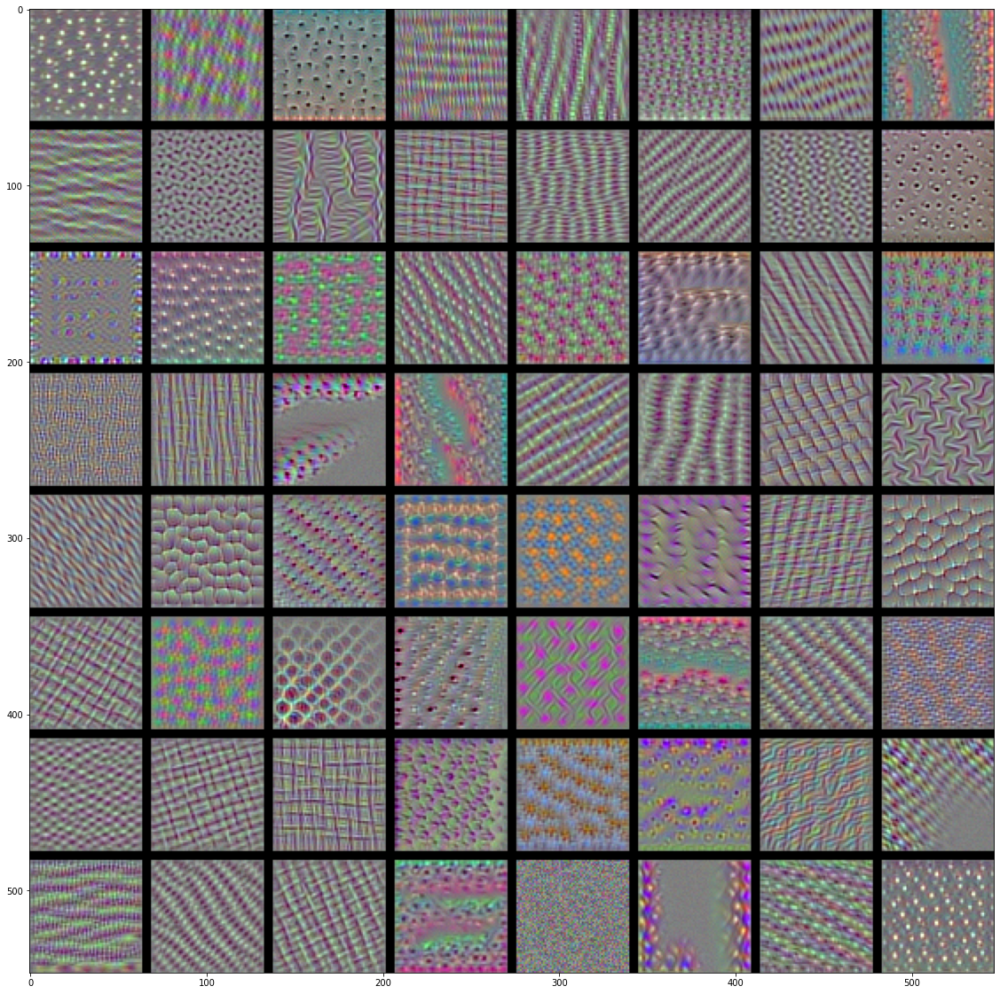

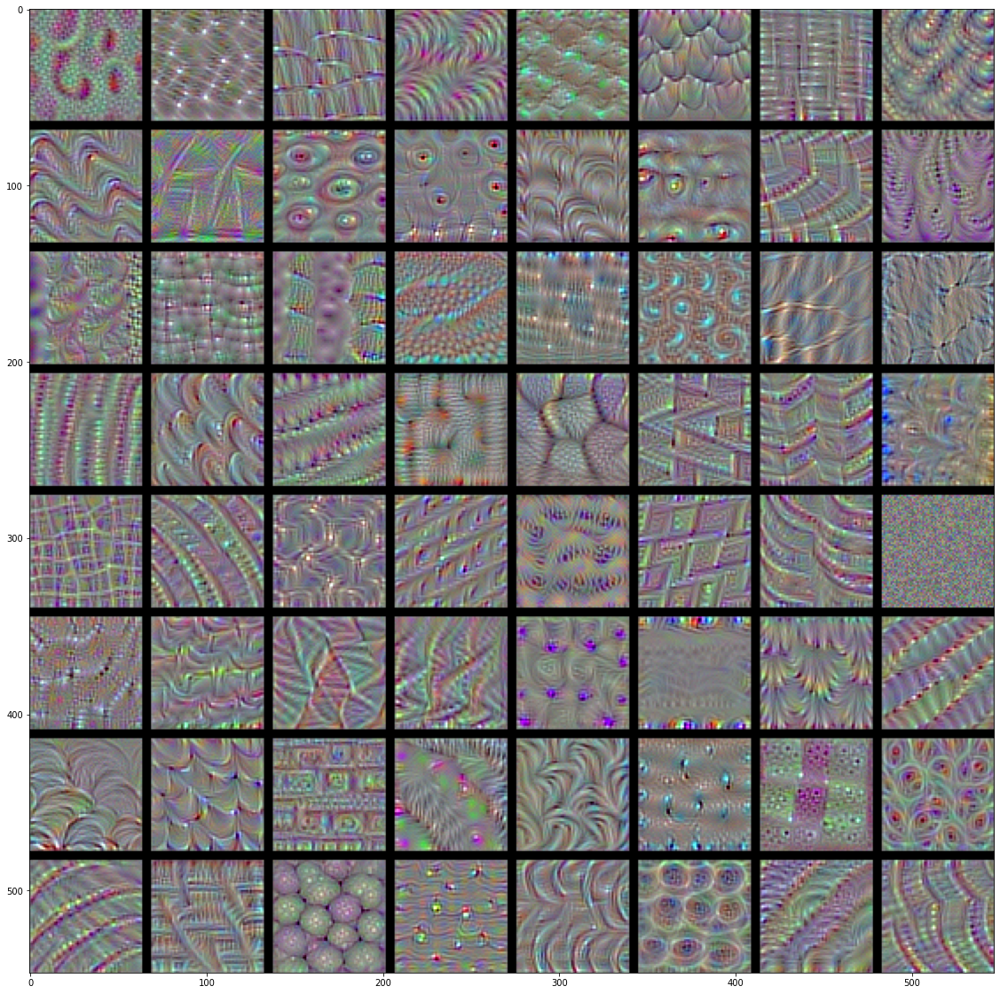

In [0]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results.astype('uint8'))
    plt.show()

These filter visualizations tell us a lot about how convnet layers see the world: each layer in a convnet simply learns a collection of filters such that their inputs can be expressed as a combination of the filters. This is similar to how the Fourier transform decomposes signals onto a bank of cosine functions. The filters in these convnet filter banks get increasingly complex and refined as we go higher-up in the model:

The filters from the first layer in the model (block1_conv1) encode simple directional edges and colors (or colored edges in some cases).
The filters from block2_conv1 encode simple textures made from combinations of edges and colors.
The filters in higher-up layers start resembling textures found in natural images: feathers, eyes, leaves, etc.

### Visualizing heatmaps of class activation

We will demonstrate this technique using the pre-trained VGG16 network again:

In [0]:
from keras.applications.vgg16 import VGG16

K.clear_session()

# Note that we are including the densely-connected classifier on top;
# all previous times, we were discarding it
model = VGG16(weights='imagenet')

553467904/553467096 [==============================] - 6s 0us/step


In [0]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

In [0]:
uploaded = files.upload()

Saving husky_2.jpg to husky_2.jpg


In [0]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions

img_path = 'husky_2.jpg'
# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224,224))
# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)
## We add a dimension to transform our array into a "batch" of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)
# Finally we preprocess the batch (this does channel-wise color normalization)
x = preprocess_input(x)

In [0]:
preds = model.predict(x)
print('Predicted: ', decode_predictions(preds, top=3)[0])


Predicted:  [('n02109961', 'Eskimo_dog', 0.32703698), ('n02110185', 'Siberian_husky', 0.19752887), ('n02114548', 'white_wolf', 0.152231)]


The entry in the prediction vector that was maximally activated is the one corresponding to the "Siberian_husky" class, at index ?:

In [0]:
np.argmax(preds[0])

248

To visualize which parts of our image were the most "Siberian_husky"-like, let's set up the Grad-CAM process:

In [0]:
siberian_husky_output = model.output[:, 248]

last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(siberian_husky_output,last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:,:,i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

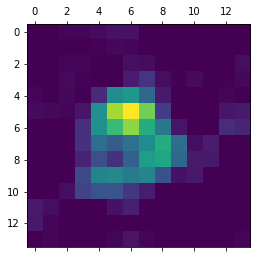

In [0]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Finally, we will use OpenCV to generate an image that superimpose the original image with the heatmap we just obtained.

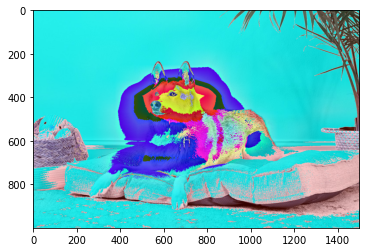

In [0]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255*heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('husky_cam.jpg', superimposed_img)
plt.imshow(superimposed_img.astype('uint8'))
plt.show()